In [1]:
#To get detailed description if get CUDA error
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

In [2]:
import os
os.chdir('../')
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [3]:
import scanpy as sc
import torch
import scarches as sca
from scarches.dataset.trvae.data_handling import remove_sparsity

import matplotlib.pyplot as plt
import numpy as np
import gdown
import time

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
 captum (see https://github.com/pytorch/captum).
INFO:lightning_fabric.utilities.seed:Global seed set to 0


In [4]:
st = time.time()

In [5]:
sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

In [6]:
condition_key = 'study'
cell_type_key = 'cell_type'
target_conditions = ['Pancreas CelSeq2', 'Pancreas SS2'] 


trvae_epochs = 500
surgery_epochs = 500

early_stopping_kwargs = {
    "early_stopping_metric": "val_unweighted_loss",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

In [7]:
url = 'https://drive.google.com/uc?id=1ehxgfHTsMZXy6YzlFKGJOsBKQ5rrvMnd'
output = 'pancreas.h5ad'
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1ehxgfHTsMZXy6YzlFKGJOsBKQ5rrvMnd
To: /home/mohammed/pancreas.h5ad
100%|████████████████████████████████████████████████████████████████████████████████| 126M/126M [00:25<00:00, 4.90MB/s]


'pancreas.h5ad'

In [8]:
adata_all = sc.read('pancreas.h5ad')

In [9]:
adata = adata_all.raw.to_adata()
# adata = sc.pp.subsample(adata, fraction=None, n_obs=1000, random_state=0, copy=True)
adata = remove_sparsity(adata)

# Surgery

In [10]:
source_adata = adata[~adata.obs[condition_key].isin(target_conditions)]
target_adata = adata[adata.obs[condition_key].isin(target_conditions)]
source_conditions = source_adata.obs[condition_key].unique().tolist()

In [11]:
trvae = sca.models.TRVAE(
    adata=source_adata,
    condition_key=condition_key,
    conditions=source_conditions,
    hidden_layer_sizes=[128, 128],
)


INITIALIZING NEW NETWORK..............
	Input Layer in, out and cond: 1000 128 3
	Hidden Layer 1 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 3
	Hidden Layer 1 in/out: 128 128
	Output Layer in/out:  128 1000 



In [12]:
trvae.train(
    n_epochs=trvae_epochs,
    alpha_epoch_anneal=200,
    early_stopping_kwargs=early_stopping_kwargs,
    learning_approach='Surgery',
)

Surgery is happening!
 |███-----------------| 17.8%  - val_loss: 597.8780076769 - val_recon_loss: 584.5374620226 - val_kl_loss: 17.1250462002 - val_mmd_loss: 5.8055239783
ADJUSTED LR
 |███-----------------| 19.2%  - val_loss: 590.0385776096 - val_recon_loss: 576.8612433539 - val_kl_loss: 16.5518027412 - val_mmd_loss: 5.3152357737
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 74


In [13]:
adata_latent = sc.AnnData(trvae.get_latent())
adata_latent.obs['cell_type'] = source_adata.obs[cell_type_key].tolist()
adata_latent.obs['batch'] = source_adata.obs[condition_key].tolist()

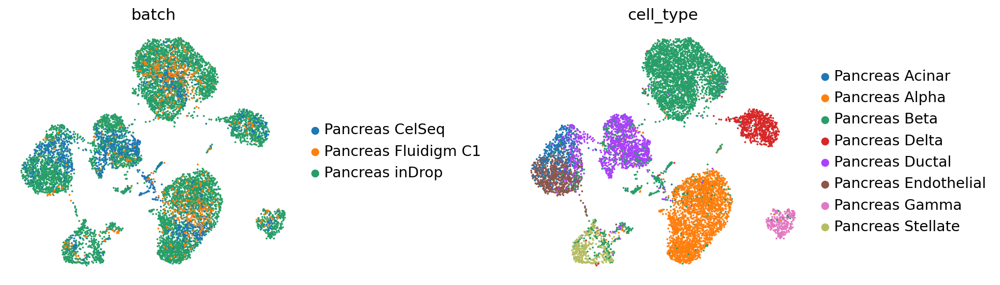

In [14]:
sc.pp.neighbors(adata_latent, n_neighbors=8)
sc.tl.leiden(adata_latent)
sc.tl.umap(adata_latent)
sc.pl.umap(adata_latent,
           color=['batch', 'cell_type'],
           frameon=False,
           wspace=0.6,
           )

In [15]:
ref_path = 'reference_model_surgery/'
trvae.save(ref_path, overwrite=True)

In [16]:
new_trvae_surgery = sca.models.TRVAE.load_query_data(adata=target_adata, learning_approach = "Surgery", model = ref_path)

View of AnnData object with n_obs × n_vars = 5387 × 1000
    obs: 'batch', 'study', 'cell_type', 'size_factors'

INITIALIZING NEW NETWORK..............
	Input Layer in, out and cond: 1000 128 5
	Hidden Layer 1 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 5
	Hidden Layer 1 in/out: 128 128
	Output Layer in/out:  128 1000 



In [17]:
new_trvae_surgery.train(
    n_epochs=surgery_epochs,
    alpha_epoch_anneal=200,
    early_stopping_kwargs=early_stopping_kwargs,
    weight_decay=0,
    learning_approach='Surgery',
)

Surgery is happening!
 |████----------------| 22.4%  - val_loss: 1089.9348632813 - val_recon_loss: 1078.8862548828 - val_kl_loss: 18.5738632202 - val_mmd_loss: 0.7401096344
ADJUSTED LR
 |█████---------------| 25.8%  - val_loss: 1083.0454101562 - val_recon_loss: 1070.4661132813 - val_kl_loss: 18.4791549683 - val_mmd_loss: 0.7526958466
ADJUSTED LR
 |█████---------------| 27.2%  - val_loss: 1114.5272949219 - val_recon_loss: 1101.1595214844 - val_kl_loss: 18.7026153564 - val_mmd_loss: 0.7435214996
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 114


In [18]:
adata_latent = sc.AnnData(new_trvae_surgery.get_latent())
adata_latent.obs['cell_type'] = target_adata.obs[cell_type_key].tolist()
adata_latent.obs['batch'] = target_adata.obs[condition_key].tolist()

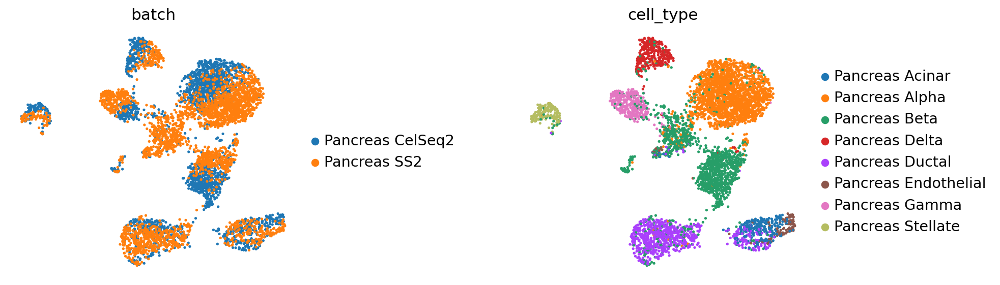

In [19]:
sc.pp.neighbors(adata_latent, n_neighbors=8)
sc.tl.leiden(adata_latent)
sc.tl.umap(adata_latent)
sc.pl.umap(adata_latent,
           color=['batch', 'cell_type'],
           frameon=False,
           wspace=0.6,
           )

In [20]:
surg_path = 'surgery_model'
new_trvae_surgery.save(surg_path, overwrite=True)

In [21]:
full_latent = sc.AnnData(new_trvae_surgery.get_latent(adata.X, adata.obs[condition_key]))
full_latent.obs['cell_type'] = adata.obs[cell_type_key].tolist()
full_latent.obs['batch'] = adata.obs[condition_key].tolist()

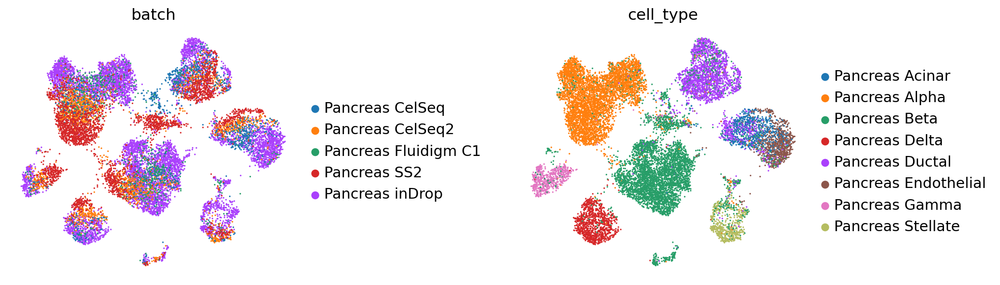

In [22]:
sc.pp.neighbors(full_latent, n_neighbors=8)
sc.tl.leiden(full_latent)
sc.tl.umap(full_latent)
sc.pl.umap(full_latent,
           color=['batch', 'cell_type'],
           frameon=False,
           wspace=0.6,
           )

# EWC

In [23]:
source_adata = adata[adata.obs['study'].isin(['Pancreas CelSeq2'])]
source_conditions = source_adata.obs[condition_key].unique().tolist()
source_conditions
adata.obs

,batch,study,cell_type,size_factors
index,,,,
0-0-0-0-0,0,Pancreas inDrop,Pancreas Endothelial,13073.0
1-0-0-0-0,0,Pancreas inDrop,Pancreas Acinar,17227.0
2-0-0-0-0,0,Pancreas inDrop,Pancreas Acinar,7844.0
3-0-0-0-0,0,Pancreas inDrop,Pancreas Acinar,10966.0
4-0-0-0-0,0,Pancreas inDrop,Pancreas Endothelial,8815.0
...,...,...,...,...
2984-1,1,Pancreas SS2,Pancreas Gamma,221018.0
2985-1,1,Pancreas SS2,Pancreas Alpha,161140.0
2986-1,1,Pancreas SS2,Pancreas Delta,144527.0


In [24]:
adata_tasks = ['Pancreas CelSeq', 'Pancreas Fluidigm C1', 'Pancreas SS2','Pancreas inDrop'] #'Pancreas CelSeq2',

In [25]:
source_adata

View of AnnData object with n_obs × n_vars = 2426 × 1000
    obs: 'batch', 'study', 'cell_type', 'size_factors'

In [26]:
trvae = sca.models.TRVAE(
    adata=source_adata,
    condition_key=condition_key,
    conditions=source_conditions,
    hidden_layer_sizes=[128, 128],
 )


INITIALIZING NEW NETWORK..............
	Input Layer in, out and cond: 1000 128 1
	Hidden Layer 1 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 1
	Hidden Layer 1 in/out: 128 128
	Output Layer in/out:  128 1000 



In [27]:
trvae.train(
    n_epochs=trvae_epochs,
    alpha_epoch_anneal=200,
    early_stopping_kwargs=early_stopping_kwargs,
    ID=0,
    learning_approach='ewc',
)

ewc is happening!
 |█████---------------| 26.6%  - val_loss: 805.1381835938 - val_recon_loss: 795.5401000977 - val_kl_loss: 14.5425496101 - val_mmd_loss: 0.00000000000
ADJUSTED LR
 |██████--------------| 33.4%  - val_loss: 799.6506347656 - val_recon_loss: 788.9930419922 - val_kl_loss: 12.8404479027 - val_mmd_loss: 0.0000000000
ADJUSTED LR
 |███████-------------| 37.2%  - val_loss: 801.0374450684 - val_recon_loss: 789.3090820312 - val_kl_loss: 12.6792936325 - val_mmd_loss: 0.0000000000
ADJUSTED LR
 |███████-------------| 38.6%  - val_loss: 802.0783691406 - val_recon_loss: 789.9217834473 - val_kl_loss: 12.6630978584 - val_mmd_loss: 0.0000000000
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Calculating fisher information!
Saving best state of network...
Best State was in Epoch 171


In [28]:
adata_latent = sc.AnnData(trvae.get_latent())
adata_latent.obs['cell_type'] = source_adata.obs[cell_type_key].tolist()
adata_latent.obs['batch'] = source_adata.obs[condition_key].tolist()

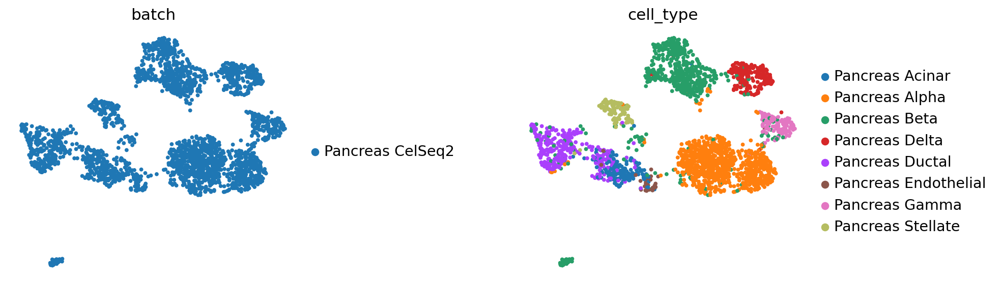

In [29]:
sc.pp.neighbors(adata_latent, n_neighbors=8)
sc.tl.leiden(adata_latent)
sc.tl.umap(adata_latent)
sc.pl.umap(adata_latent,
           color=['batch', 'cell_type'],
           frameon=False,
           wspace=0.6,
           )

In [30]:
ref_path = 'model_EWC_1/'
trvae.save(ref_path, overwrite=True)

In [31]:
for ID, task in enumerate(adata_tasks, start=1): #adata_tasks[1:] if you wanna skip the first item
    print(ID)
    task_i = adata[adata.obs[condition_key].isin([task])]
    new_trvae_EWC_1 = sca.models.TRVAE.load_query_data(adata=task_i,
                                                 learning_approach = 'ewc',
                                                 model=ref_path)
    new_trvae_EWC_1.train(
    n_epochs=surgery_epochs,
    alpha_epoch_anneal=200,
    early_stopping_kwargs=early_stopping_kwargs,
    ID=ID,
    weight_decay=0,
    learning_approach = 'ewc'
    )
    
    ref_path = 'model_EWC_1/'#+ str (ID)
    new_trvae_EWC_1.save(ref_path, overwrite=True)

1
View of AnnData object with n_obs × n_vars = 1271 × 1000
    obs: 'batch', 'study', 'cell_type', 'size_factors'

INITIALIZING NEW NETWORK..............
	Input Layer in, out and cond: 1000 128 2
	Hidden Layer 1 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 2
	Hidden Layer 1 in/out: 128 128
	Output Layer in/out:  128 1000 

ewc is happening!
 |█████---------------| 26.6%  - val_loss: 559.1198120117 - val_recon_loss: 547.8925781250 - val_kl_loss: 17.0109462738 - val_mmd_loss: 0.0000000000
ADJUSTED LR
 |█████---------------| 28.0%  - val_loss: 558.5895385742 - val_recon_loss: 547.0438232422 - val_kl_loss: 16.6125164032 - val_mmd_loss: 0.0000000000
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Calculating fisher information!
Saving best state of network...
Best State was in Epoch 118
2
View of An

In [32]:
surg_path = 'model_EWC_1'
new_trvae_EWC_1.save(surg_path, overwrite=True)

In [33]:
full_latent = sc.AnnData(new_trvae_EWC_1.get_latent(adata.X, adata.obs[condition_key]))
full_latent.obs['cell_type'] = adata.obs[cell_type_key].tolist()
full_latent.obs['batch'] = adata.obs[condition_key].tolist()
full_latent.obsm

AxisArrays with keys: 

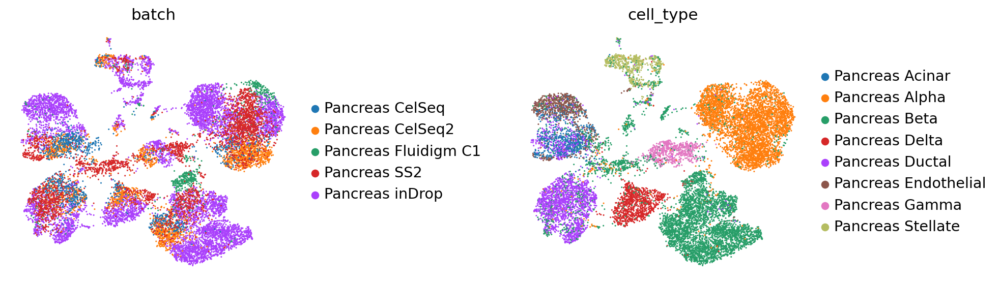

In [34]:
sc.pp.neighbors(full_latent, n_neighbors=8)
sc.tl.leiden(full_latent)
sc.tl.umap(full_latent)
sc.pl.umap(full_latent,
           color=['batch', 'cell_type'],
           frameon=False,
           wspace=0.6,
           )

# Standard

In [35]:
conditions = adata.obs[condition_key].unique().tolist()
conditions, adata

(['Pancreas inDrop',
  'Pancreas CelSeq2',
  'Pancreas CelSeq',
  'Pancreas Fluidigm C1',
  'Pancreas SS2'],
 AnnData object with n_obs × n_vars = 15681 × 1000
     obs: 'batch', 'study', 'cell_type', 'size_factors')

In [36]:
trvae_std = sca.models.TRVAE(
    adata=adata,
    condition_key=condition_key,
    conditions=conditions,
    hidden_layer_sizes=[128, 128],
 )


INITIALIZING NEW NETWORK..............
	Input Layer in, out and cond: 1000 128 5
	Hidden Layer 1 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 5
	Hidden Layer 1 in/out: 128 128
	Output Layer in/out:  128 1000 



In [37]:
trvae_std.train(
    n_epochs=trvae_epochs,
    alpha_epoch_anneal=200,
    early_stopping_kwargs=early_stopping_kwargs,
    ID=0,
    learning_approach='rehearsal',
)

rehearsal is happening!
 |██------------------| 13.0%  - val_loss: 760.3327495868 - val_recon_loss: 734.3236459585 - val_kl_loss: 22.1444531954 - val_mmd_loss: 18.92287826547
ADJUSTED LR
 |██------------------| 14.4%  - val_loss: 764.3848407452 - val_recon_loss: 737.8087064303 - val_kl_loss: 21.3434609633 - val_mmd_loss: 18.9992022881
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 50


In [38]:
adata_latent = sc.AnnData(trvae_std.get_latent())
adata_latent.obs['cell_type'] = adata.obs[cell_type_key].tolist()
adata_latent.obs['batch'] = adata.obs[condition_key].tolist()

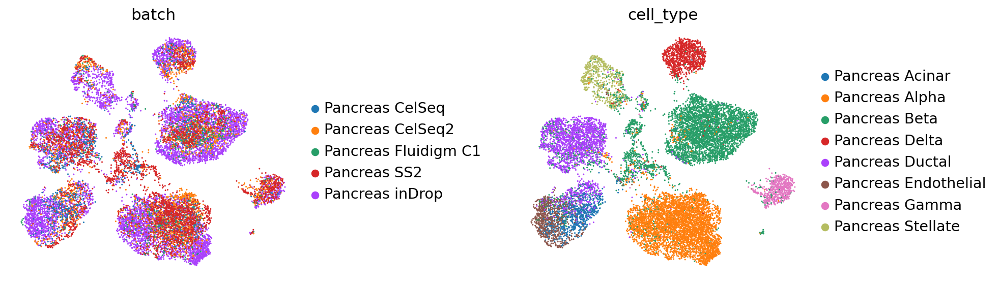

In [39]:
sc.pp.neighbors(adata_latent, n_neighbors=8)
sc.tl.leiden(adata_latent)
sc.tl.umap(adata_latent)
sc.pl.umap(adata_latent,
           color=['batch', 'cell_type'],
           frameon=False,
           wspace=0.6,
           )

In [40]:
ref_path = 'model_standard/'
trvae_std.save(ref_path, overwrite=True)

# LR_EWC

In [41]:
source_adata = adata[adata.obs[condition_key].isin(['Pancreas CelSeq2'])]
source_conditions = source_adata.obs[condition_key].unique().tolist()
source_conditions

['Pancreas CelSeq2']

In [42]:
adata_tasks = ['Pancreas CelSeq2','Pancreas CelSeq', 'Pancreas Fluidigm C1', 'Pancreas SS2','Pancreas inDrop'] #'Pancreas CelSeq2',

In [43]:
trvae = sca.models.TRVAE(
    adata=source_adata,
    condition_key=condition_key,
    conditions=source_conditions,
    hidden_layer_sizes=[128, 128],
 )


INITIALIZING NEW NETWORK..............
	Input Layer in, out and cond: 1000 128 1
	Hidden Layer 1 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 1
	Hidden Layer 1 in/out: 128 128
	Output Layer in/out:  128 1000 



In [44]:
trvae.train(
    n_epochs=trvae_epochs,
    alpha_epoch_anneal=200,
    early_stopping_kwargs=early_stopping_kwargs,
    ID=0,
    learning_approach='LR+EWC',
)

LR+EWC is happening!
 |█████---------------| 26.4%  - val_loss: 785.0718383789 - val_recon_loss: 776.4229125977 - val_kl_loss: 13.2044525146 - val_mmd_loss: 0.00000000000
ADJUSTED LR
 |██████--------------| 34.0%  - val_loss: 785.4067077637 - val_recon_loss: 775.0019226074 - val_kl_loss: 12.3133554459 - val_mmd_loss: 0.0000000000
ADJUSTED LR
 |███████-------------| 38.0%  - val_loss: 783.8940124512 - val_recon_loss: 772.4000549316 - val_kl_loss: 12.1629443169 - val_mmd_loss: 0.0000000000
ADJUSTED LR
 |███████-------------| 39.4%  - val_loss: 784.2174377441 - val_recon_loss: 772.2977600098 - val_kl_loss: 12.1629476547 - val_mmd_loss: 0.0000000000
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Calculating fisher information!
Saving best state of network...
Best State was in Epoch 175


In [45]:
adata_latent = sc.AnnData(trvae.get_latent())
adata_latent.obs['cell_type'] = source_adata.obs[cell_type_key].tolist()
adata_latent.obs['batch'] = source_adata.obs[condition_key].tolist()

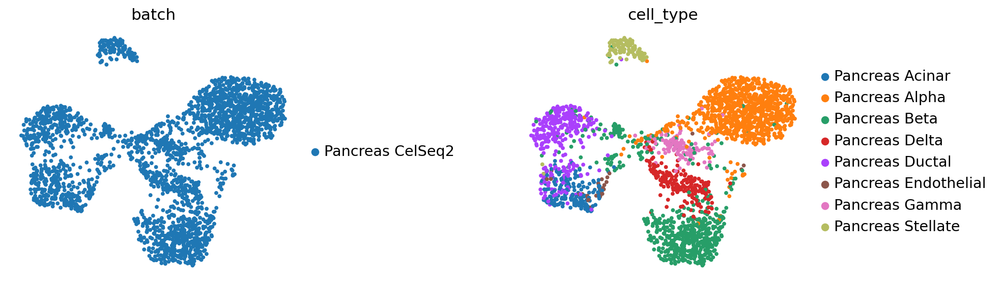

In [46]:
sc.pp.neighbors(adata_latent, n_neighbors=8)
sc.tl.leiden(adata_latent)
sc.tl.umap(adata_latent)
sc.pl.umap(adata_latent,
           color=['batch', 'cell_type'],
           frameon=False,
           wspace=0.6,
           )

In [47]:
ref_path = 'model_LR_1_EWC_1/'
trvae.save(ref_path, overwrite=True)

In [48]:
for ID, task in enumerate(adata_tasks[1:], start=1): #adata_tasks[1:] if you wanna skip the first item
    task_i = adata[adata.obs[condition_key].isin([task])]
    new_trvae_LR_1_EWC_1 = sca.models.TRVAE.load_query_data(adata=task_i,
                                                 learning_approach = 'LR+EWC',
                                                 model=ref_path)
    new_trvae_LR_1_EWC_1.train(
    n_epochs=surgery_epochs,
    alpha_epoch_anneal=200,
    early_stopping_kwargs=early_stopping_kwargs,
    ID=ID,
    weight_decay=0,
    learning_approach = 'LR+EWC'
    )
    
    ref_path = 'model_LR_1_EWC_1/'#+ str (ID)
    new_trvae_LR_1_EWC_1.save(ref_path, overwrite=True)

View of AnnData object with n_obs × n_vars = 1271 × 1000
    obs: 'batch', 'study', 'cell_type', 'size_factors'

INITIALIZING NEW NETWORK..............
	Input Layer in, out and cond: 1000 128 2
	Hidden Layer 1 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 2
	Hidden Layer 1 in/out: 128 128
	Output Layer in/out:  128 1000 

LR+EWC is happening!
 |█████---------------| 25.0%  - val_loss: 625.6979980469 - val_recon_loss: 609.0168457031 - val_kl_loss: 26.9050350189 - val_mmd_loss: 0.0000000000
ADJUSTED LR
 |███████-------------| 37.8%  - val_loss: 631.3853149414 - val_recon_loss: 607.0944213867 - val_kl_loss: 25.8413524628 - val_mmd_loss: 0.0000000000
ADJUSTED LR
 |████████------------| 44.2%  - val_loss: 631.5919189453 - val_recon_loss: 605.8233642578 - val_kl_loss: 25.7685413361 - val_mmd_loss: 0.0000000000
ADJUSTED LR
 |█████████-----------| 45.6%  - val_loss: 633.0250854492 - val_recon_loss: 607.2584838867 - val_kl_loss: 25.7

In [49]:
surg_path = 'model_LR_1_EWC_1/'
new_trvae_LR_1_EWC_1.save(surg_path, overwrite=True)

In [50]:
full_latent = sc.AnnData(new_trvae_LR_1_EWC_1.get_latent(adata.X, adata.obs[condition_key]))
full_latent.obs['cell_type'] = adata.obs[cell_type_key].tolist()
full_latent.obs['batch'] = adata.obs[condition_key].tolist()
full_latent.obsm

AxisArrays with keys: 

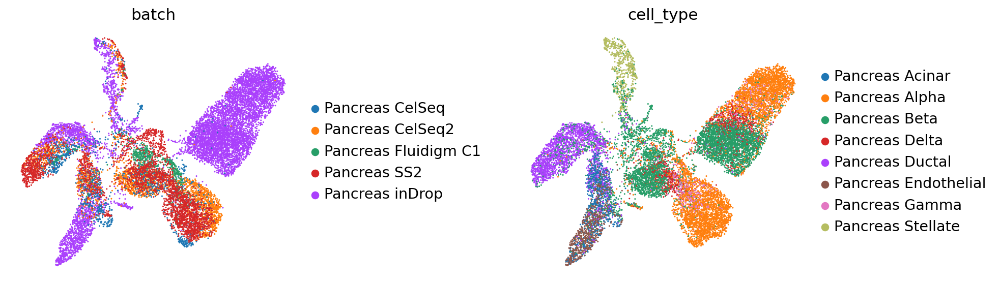

In [51]:
sc.pp.neighbors(full_latent, n_neighbors=8)
sc.tl.leiden(full_latent)
sc.tl.umap(full_latent)
sc.pl.umap(full_latent,
           color=['batch', 'cell_type'],
           frameon=False,
           wspace=0.6,
           )

# LR

In [52]:
source_adata = adata[adata.obs[condition_key].isin(['Pancreas CelSeq2'])]
source_conditions = source_adata.obs[condition_key].unique().tolist()
source_adata

View of AnnData object with n_obs × n_vars = 2426 × 1000
    obs: 'batch', 'study', 'cell_type', 'size_factors'

In [53]:
adata_tasks = ['Pancreas CelSeq2','Pancreas CelSeq', 'Pancreas Fluidigm C1', 'Pancreas SS2','Pancreas inDrop'] #'Pancreas CelSeq2',

In [54]:
trvae = sca.models.TRVAE(
    adata=source_adata,
    condition_key=condition_key,
    conditions=source_conditions,
    hidden_layer_sizes=[128, 128],
 )


INITIALIZING NEW NETWORK..............
	Input Layer in, out and cond: 1000 128 1
	Hidden Layer 1 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 1
	Hidden Layer 1 in/out: 128 128
	Output Layer in/out:  128 1000 



In [55]:
trvae.train(
    n_epochs=trvae_epochs,
    alpha_epoch_anneal=200,
    early_stopping_kwargs=early_stopping_kwargs,
    ID=0,
    learning_approach='latent replay',
)

latent replay is happening!
 |██████--------------| 31.0%  - val_loss: 813.1237792969 - val_recon_loss: 801.9800720215 - val_kl_loss: 14.4723386765 - val_mmd_loss: 0.00000000000
ADJUSTED LR
 |███████-------------| 36.6%  - val_loss: 807.0499572754 - val_recon_loss: 796.3372497559 - val_kl_loss: 11.7722258568 - val_mmd_loss: 0.0000000000
ADJUSTED LR
 |███████-------------| 39.6%  - val_loss: 805.9153137207 - val_recon_loss: 794.4553222656 - val_kl_loss: 11.6345086098 - val_mmd_loss: 0.0000000000
ADJUSTED LR
 |████████------------| 42.6%  - val_loss: 805.3312683105 - val_recon_loss: 793.6764221191 - val_kl_loss: 11.6548490524 - val_mmd_loss: 0.0000000000
ADJUSTED LR
 |████████------------| 44.0%  - val_loss: 806.4325561523 - val_recon_loss: 794.7707214355 - val_kl_loss: 11.6618509293 - val_mmd_loss: 0.0000000000
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method

In [56]:
adata_latent = sc.AnnData(trvae.get_latent())
adata_latent.obs['cell_type'] = source_adata.obs[cell_type_key].tolist()
adata_latent.obs['batch'] = source_adata.obs[condition_key].tolist()

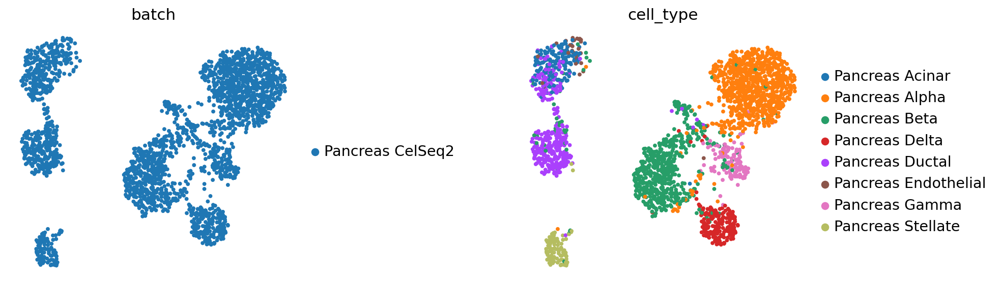

In [57]:
sc.pp.neighbors(adata_latent, n_neighbors=8)
sc.tl.leiden(adata_latent)
sc.tl.umap(adata_latent)
sc.pl.umap(adata_latent,
           color=['batch', 'cell_type'],
           frameon=False,
           wspace=0.6,
           )

In [58]:
ref_path = 'model_LR_1/'
trvae.save(ref_path, overwrite=True)

In [59]:
for ID, task in enumerate(adata_tasks[1:], start=1): #adata_tasks[1:] if you wanna skip the first item
    print(ID)
    task_i = adata[adata.obs[condition_key].isin([task])]
    new_trvae_LR_1 = sca.models.TRVAE.load_query_data(adata=task_i,
                                                 learning_approach = 'latent replay',
                                                 model=ref_path)
    new_trvae_LR_1.train(
    n_epochs=surgery_epochs,
    alpha_epoch_anneal=200,
    early_stopping_kwargs=early_stopping_kwargs,
    ID=ID,
    weight_decay=0,
    learning_approach = 'latent replay'
    )
    
    ref_path = 'model_LR_1/'
    new_trvae_LR_1.save(ref_path, overwrite=True)

1
View of AnnData object with n_obs × n_vars = 1271 × 1000
    obs: 'batch', 'study', 'cell_type', 'size_factors'

INITIALIZING NEW NETWORK..............
	Input Layer in, out and cond: 1000 128 2
	Hidden Layer 1 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 2
	Hidden Layer 1 in/out: 128 128
	Output Layer in/out:  128 1000 

latent replay is happening!
 |█████████-----------| 47.4%  - val_loss: 593.1680908203 - val_recon_loss: 576.4847412109 - val_kl_loss: 16.6833553314 - val_mmd_loss: 0.0000000000
ADJUSTED LR
 |███████████---------| 58.8%  - val_loss: 587.7712402344 - val_recon_loss: 571.5682983398 - val_kl_loss: 16.2029705048 - val_mmd_loss: 0.0000000000
ADJUSTED LR
 |████████████--------| 60.2%  - val_loss: 590.2921142578 - val_recon_loss: 574.0837402344 - val_kl_loss: 16.2083969116 - val_mmd_loss: 0.0000000000
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, pl

In [60]:
surg_path = 'model_LR_1/'
new_trvae_LR_1.save(surg_path, overwrite=True)

In [61]:
full_latent = sc.AnnData(new_trvae_LR_1.get_latent(adata.X, adata.obs[condition_key]))
full_latent.obs['cell_type'] = adata.obs[cell_type_key].tolist()
full_latent.obs['batch'] = adata.obs[condition_key].tolist()
full_latent.obsm

AxisArrays with keys: 

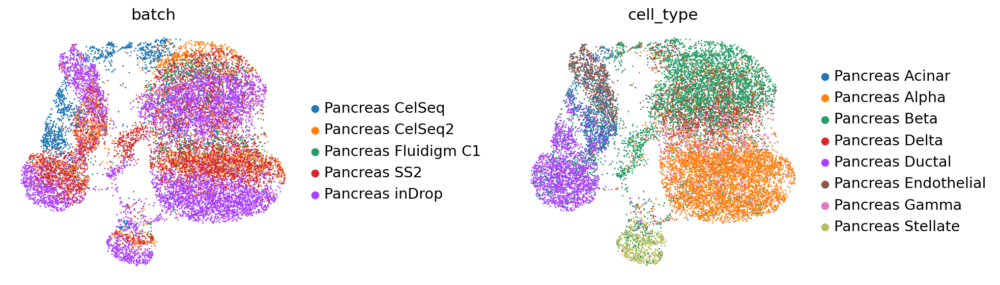

In [62]:
sc.pp.neighbors(full_latent, n_neighbors=8)
sc.tl.leiden(full_latent)
sc.tl.umap(full_latent)
sc.pl.umap(full_latent,
           color=['batch', 'cell_type'],
           frameon=False,
           wspace=0.6,
           )

# Rehearsal

In [63]:
source_adata = adata[adata.obs[condition_key].isin(['Pancreas CelSeq2'])]
source_conditions = source_adata.obs[condition_key].unique().tolist()
source_conditions, source_adata

(['Pancreas CelSeq2'],
 View of AnnData object with n_obs × n_vars = 2426 × 1000
     obs: 'batch', 'study', 'cell_type', 'size_factors')

In [64]:
adata_tasks = ['Pancreas CelSeq2','Pancreas CelSeq', 'Pancreas Fluidigm C1', 'Pancreas SS2','Pancreas inDrop'] #'Pancreas CelSeq2',

In [65]:
trvae = sca.models.TRVAE(
    adata=source_adata,
    condition_key=condition_key,
    conditions=source_conditions,
    hidden_layer_sizes=[128, 128],
 )


INITIALIZING NEW NETWORK..............
	Input Layer in, out and cond: 1000 128 1
	Hidden Layer 1 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 1
	Hidden Layer 1 in/out: 128 128
	Output Layer in/out:  128 1000 



In [66]:
trvae.train(
    n_epochs=trvae_epochs,
    alpha_epoch_anneal=200,
    early_stopping_kwargs=early_stopping_kwargs,
    ID=0,
    learning_approach='rehearsal',
)

rehearsal is happening!
 |███████-------------| 39.0%  - val_loss: 737.9950256348 - val_recon_loss: 726.5751037598 - val_kl_loss: 11.7731361389 - val_mmd_loss: 0.00000000000
ADJUSTED LR
 |████████------------| 44.8%  - val_loss: 737.8554992676 - val_recon_loss: 726.1116638184 - val_kl_loss: 11.7438359261 - val_mmd_loss: 0.0000000000
ADJUSTED LR
 |█████████-----------| 46.2%  - val_loss: 735.6385498047 - val_recon_loss: 723.8539428711 - val_kl_loss: 11.7846274376 - val_mmd_loss: 0.0000000000
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 209


In [67]:
adata_latent = sc.AnnData(trvae.get_latent())
adata_latent.obs['cell_type'] = source_adata.obs[cell_type_key].tolist()
adata_latent.obs['batch'] = source_adata.obs[condition_key].tolist()

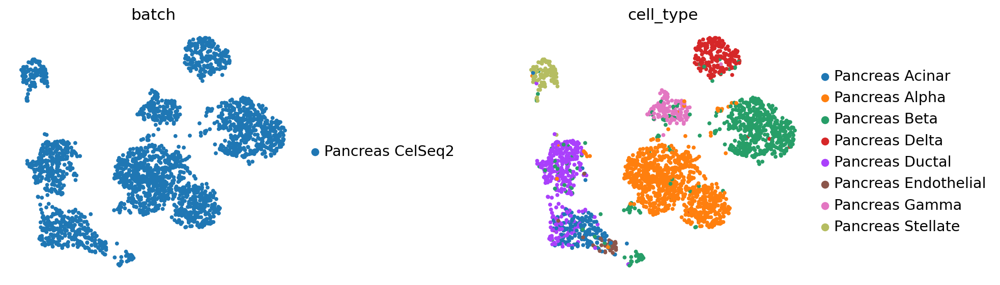

In [68]:
sc.pp.neighbors(adata_latent, n_neighbors=8)
sc.tl.leiden(adata_latent)
sc.tl.umap(adata_latent)
sc.pl.umap(adata_latent,
           color=['batch', 'cell_type'],
           frameon=False,
           wspace=0.6,
           )

In [69]:
ref_path = 'model_rehearsal/'
trvae.save(ref_path, overwrite=True)

In [70]:
new_tasks = adata_tasks[1:]
for ID in range(len(new_tasks)): #adata_tasks[1:] if you wanna skip the first item, , start=1
    print('ID BEFORE:', ID)
    ID +=1
    print('ID:', ID)
    
    for ID_past in range(ID):
        print('ID_past:', ID_past)
        task_i = adata[adata.obs[condition_key].isin([adata_tasks[ID_past],adata_tasks[ID]])]
        print('adata_tasks[ID_past,ID]:', [adata_tasks[ID_past],adata_tasks[ID]])
        print('task_i:', task_i)
        new_trvae_rehearsal = sca.models.TRVAE.load_query_data(adata=task_i,
                                                     learning_approach = 'rehearsal',
                                                     model=ref_path)
        new_trvae_rehearsal.train(
        n_epochs=surgery_epochs,
        alpha_epoch_anneal=200,
        early_stopping_kwargs=early_stopping_kwargs,
        #ID=ID,
        weight_decay=0,
        learning_approach = 'rehearsal'
        )

        ref_path = 'model_rehearsal/'#+ str (ID)
        new_trvae_rehearsal.save(ref_path, overwrite=True)

ID BEFORE: 0
ID: 1
ID_past: 0
adata_tasks[ID_past,ID]: ['Pancreas CelSeq2', 'Pancreas CelSeq']
task_i: View of AnnData object with n_obs × n_vars = 3697 × 1000
    obs: 'batch', 'study', 'cell_type', 'size_factors'
View of AnnData object with n_obs × n_vars = 3697 × 1000
    obs: 'batch', 'study', 'cell_type', 'size_factors'

INITIALIZING NEW NETWORK..............
	Input Layer in, out and cond: 1000 128 2
	Hidden Layer 1 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 2
	Hidden Layer 1 in/out: 128 128
	Output Layer in/out:  128 1000 

rehearsal is happening!
 |███-----------------| 17.0%  - val_loss: 652.4603678385 - val_recon_loss: 643.8661092122 - val_kl_loss: 19.4819342295 - val_mmd_loss: 0.4118550618
ADJUSTED LR
 |████----------------| 21.6%  - val_loss: 652.1369628906 - val_recon_loss: 641.7618611654 - val_kl_loss: 18.6454544067 - val_mmd_loss: 0.3997879028
ADJUSTED LR
 |█████---------------| 27.2%  - val_loss: 653.217386

 |███-----------------| 15.2%  - val_loss: 460.1389024523 - val_recon_loss: 451.6327209473 - val_kl_loss: 21.1416528490 - val_mmd_loss: 0.5780580309
ADJUSTED LR
 |███-----------------| 19.0%  - val_loss: 461.8677842882 - val_recon_loss: 451.8304104275 - val_kl_loss: 20.2070888943 - val_mmd_loss: 0.5400403341
ADJUSTED LR
 |████----------------| 20.4%  - val_loss: 462.5329149034 - val_recon_loss: 451.9303554959 - val_kl_loss: 19.9204241435 - val_mmd_loss: 0.5427343580
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 80
ID_past: 1
adata_tasks[ID_past,ID]: ['Pancreas CelSeq', 'Pancreas inDrop']
task_i: View of AnnData object with n_obs × n_vars = 9662 × 1000
    obs: 'batch', 'study', 'cell_type', 'size_factors'
View of AnnData object with n_obs × n_vars = 9662 × 1000
    obs: 'batch', 'study', 'cell_type'

In [71]:
surg_path = 'model_rehearsal/'
new_trvae_rehearsal.save(surg_path, overwrite=True)

In [72]:
full_latent = sc.AnnData(new_trvae_rehearsal.get_latent(adata.X, adata.obs[condition_key]))
full_latent.obs['cell_type'] = adata.obs[cell_type_key].tolist()
full_latent.obs['batch'] = adata.obs[condition_key].tolist()
full_latent.obsm

AxisArrays with keys: 

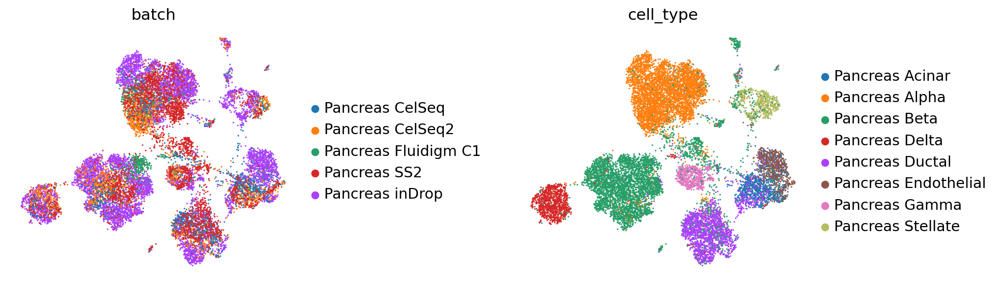

In [73]:
sc.pp.neighbors(full_latent, n_neighbors=8)
sc.tl.leiden(full_latent)
sc.tl.umap(full_latent)
sc.pl.umap(full_latent,
           color=['batch', 'cell_type'],
           frameon=False,
           wspace=0.6,
           )

In [74]:
elapsed_time = time.time() - st
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(elapsed_time)))

Execution time: 06:04:25


In [75]:
# !pip install scib

In [76]:
import scanpy
import scib
# arches_nb_graph=sc.pp.neighbors(full_latent, n_neighbors=8, n_pcs=None, use_rep='X')
# Batch_corr_graph_conn_surgery=scib.metrics.graph_connectivity(full_latent, 'batch')
# Batch_corr_graph_conn_surgery

In [77]:
# sc.tl.umap(full_latent)
# Batch_corr_ASW_surgery=scib.metrics.silhouette_batch(full_latent, batch_key='batch', group_key='cell_type', embed='X_umap')
# Batch_corr_ASW_surgery


In [78]:
# Bio_cons_ASW_surgery=scib.metrics.silhouette(full_latent, group_key='cell_type', embed='X_umap')
# Bio_cons_ASW_surgery

In [79]:
# isolated_labels_surgery=scib.metrics.isolated_labels(full_latent, label_key='cell_type', batch_key='batch', embed='X_umap')
# isolated_labels_surgery

In [80]:
# pcr_surgery=scib.metrics.pcr_comparison(source_adata, adata, covariate='batch', embed=None, n_comps=50, scale=False, verbose=False)
# pcr_surgery

In [81]:
#                    'latent replay_1%': [],
#                    'latent replay_10%': [],
#                    'latent replay_50%': [],'Bio_cons_graph_conn'
#                    'latent replay_100%': [],

Batch_corr_graph_conn_surgery= 0.7608051257578508
Batch_corr_graph_conn_onetenth=0.9048741734427915
Batch_corr_graph_conn_onefourth= 0.899889876263836
Batch_corr_graph_conn_oneseven=0.900851122200876
Batch_corr_graph_conn_justone=0.907825266669773
Batch_corr_graph_conn_rehearsal= 0.8419137670991846
Batch_corr_graph_conn_LR_1= 0.9525413804706051
Batch_corr_graph_conn_LR_1_EWC_1= 0.8538528428288419
Batch_corr_graph_conn_std = 0.6525543008643219   

Batch_corr_ASW_surgery= 0.8224623662914746
Batch_corr_ASW_onetenth=0.7700163313882914
Batch_corr_ASW_onefourth= 0.7647092329403207
Batch_corr_ASW_oneseven=0.7677420977118364
Batch_corr_ASW_justone=0.7442970386211107
Batch_corr_ASW_rehearsal=0.8056815952195894
Batch_corr_ASW_LR_1= 0.6539111201049619
Batch_corr_ASW_LR_1_EWC_1= 0.7546766773118789
Batch_corr_ASW_std= 0.8286109488080287

Bio_cons_ASW_surgery= 0.6725379973649979
Bio_cons_ASW_onetenth=0.6302791982889175
Bio_cons_ASW_onefourth=0.6720504760742188
Bio_cons_ASW_oneseven=0.6242425590753555
Bio_cons_ASW_justone=  0.5981042683124542  #0.7442970386211107 
Bio_cons_ASW_rehearsal=0.6269718110561371
Bio_cons_ASW_LR_1= 0.5299279093742371 
Bio_cons_ASW_LR_1_EWC_1= 0.5416091568768024
Bio_cons_ASW_std= 0.6770734935998917

isolated_labels_surgery= 0.8431870919111784
isolated_labels_onetenth=0.8439304117951834
isolated_labels_onefourth=0.8283473352451141
isolated_labels_oneseven = 0.8430725908139767
isolated_labels_justone=   0.8423944609068901 #0.8312470266054668
isolated_labels_rehearsal=0.8334421194080218
isolated_labels_LR_1= 0.6812798420335051
isolated_labels_LR_1_EWC_1= 0.7180090584900156
isolated_labels_std= 0.8447661032386597

pcr_surgery = 0.028701497023668674
pcr_onetenth = 0.02870146673652502
pcr_onefourth=0.02870146673652502
pcr_oneseven = 0.02870146673652502 
pcr_justone = 0.02870146673652502
pcr_rehearsal = 0.02870146673652502
pcr_LR_1= 0.02870146673652502
pcr_LR_1_EWC_1= 0.02870146673652502
pcr_std = 0


import pandas as pd
methods_metrics = {'Surgery': [isolated_labels_surgery,Bio_cons_ASW_surgery,
                               Batch_corr_ASW_surgery, Batch_corr_graph_conn_surgery, pcr_surgery, 
                               (isolated_labels_surgery+Bio_cons_ASW_surgery+
                               Batch_corr_ASW_surgery+ Batch_corr_graph_conn_surgery+ pcr_surgery)/5], 
#                    'ewc_0.1': [isolated_labels_onetenth, Bio_cons_ASW_onetenth, 
#                                Batch_corr_ASW_onetenth, Batch_corr_graph_conn_onetenth,pcr_onetenth, 
#                                (isolated_labels_onetenth+ Bio_cons_ASW_onetenth+ 
#                                Batch_corr_ASW_onetenth+ Batch_corr_graph_conn_onetenth +pcr_onetenth)/5],
#                    'ewc_0.4': [isolated_labels_onefourth, Bio_cons_ASW_onefourth,
#                                Batch_corr_ASW_onefourth, Batch_corr_graph_conn_onefourth,pcr_onefourth, 
#                                (isolated_labels_onefourth+ Bio_cons_ASW_onefourth+
#                                Batch_corr_ASW_onefourth+ Batch_corr_graph_conn_onefourth+pcr_onefourth)/5], 
#                    'ewc_0.7':[isolated_labels_oneseven, Bio_cons_ASW_oneseven, 
#                               Batch_corr_ASW_oneseven, Batch_corr_graph_conn_oneseven, pcr_oneseven, 
#                               (isolated_labels_oneseven+ Bio_cons_ASW_oneseven+ 
#                               Batch_corr_ASW_oneseven+ Batch_corr_graph_conn_oneseven+ pcr_oneseven)/5],
                   'ewc_1': [isolated_labels_justone, Bio_cons_ASW_justone,
                               Batch_corr_ASW_justone, Batch_corr_graph_conn_justone, pcr_justone, 
                             (isolated_labels_justone+ Bio_cons_ASW_justone+
                               Batch_corr_ASW_justone+ Batch_corr_graph_conn_justone+ pcr_justone)/5], 
                   'rehearsal': [isolated_labels_rehearsal, Bio_cons_ASW_rehearsal, 
                               Batch_corr_ASW_rehearsal, Batch_corr_graph_conn_rehearsal, pcr_rehearsal,
                             (isolated_labels_rehearsal+ Bio_cons_ASW_rehearsal+ 
                               Batch_corr_ASW_rehearsal+ Batch_corr_graph_conn_rehearsal+ pcr_rehearsal)/5],
                  'Latent_replay_1.0':[isolated_labels_LR_1, Bio_cons_ASW_LR_1,
                               Batch_corr_ASW_LR_1, Batch_corr_graph_conn_LR_1, pcr_LR_1, 
                             (isolated_labels_LR_1+ Bio_cons_ASW_LR_1+
                               Batch_corr_ASW_LR_1+ Batch_corr_graph_conn_LR_1+ pcr_LR_1)/5],
                  'LR_1+EWC_1.0': [isolated_labels_LR_1_EWC_1, Bio_cons_ASW_LR_1_EWC_1, 
                               Batch_corr_ASW_LR_1_EWC_1, Batch_corr_graph_conn_LR_1_EWC_1, pcr_LR_1_EWC_1, 
                             (isolated_labels_LR_1_EWC_1+ Bio_cons_ASW_LR_1_EWC_1+ 
                               Batch_corr_ASW_LR_1_EWC_1+ Batch_corr_graph_conn_LR_1_EWC_1+ pcr_LR_1_EWC_1)/5],
                  'standard':[isolated_labels_std, Bio_cons_ASW_std, 
                               Batch_corr_ASW_std, Batch_corr_graph_conn_std, pcr_std, 
                             (isolated_labels_std+ Bio_cons_ASW_std+ 
                               Batch_corr_ASW_std+ Batch_corr_graph_conn_std+ pcr_std)/5]} 
index = ['isolated_labels','Bio_cons_ASW', 'Batch_corr_ASW','Batch_corr_graph_conn', 'pcr',  'overall'] 
methods_metrics_df = pd.DataFrame(data=methods_metrics, index=index)
methods_metrics_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6 entries, isolated_labels to overall
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Surgery            6 non-null      float64
 1   ewc_1              6 non-null      float64
 2   rehearsal          6 non-null      float64
 3   Latent_replay_1.0  6 non-null      float64
 4   LR_1+EWC_1.0       6 non-null      float64
 5   standard           6 non-null      float64
dtypes: float64(6)
memory usage: 336.0+ bytes


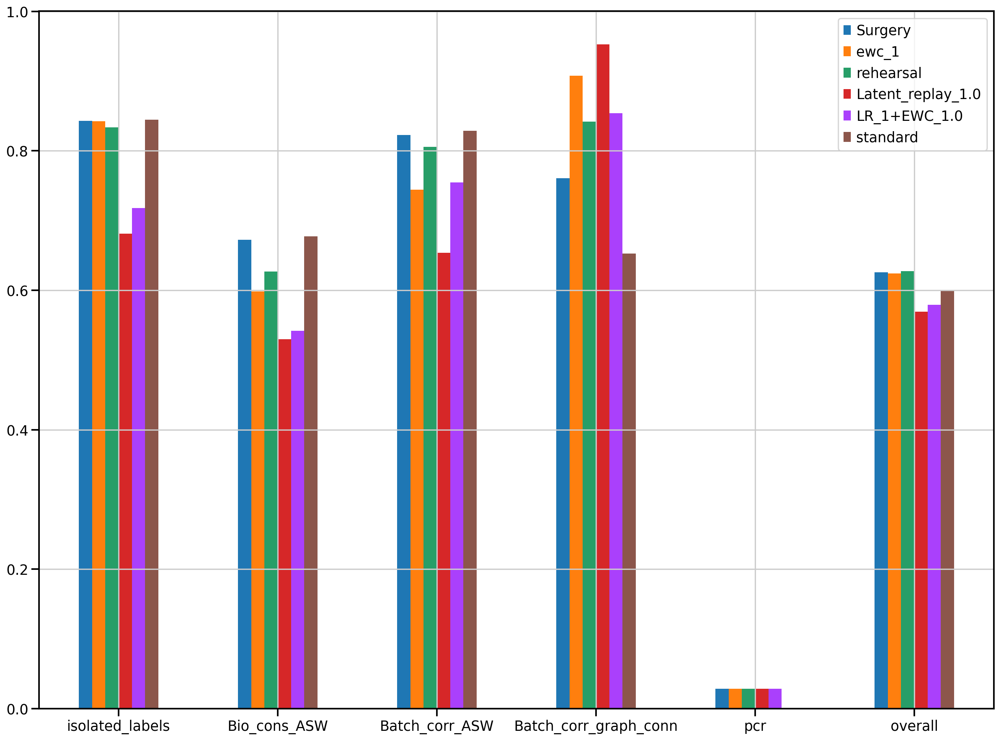

In [82]:
ax = methods_metrics_df.plot.bar(rot=0, figsize = (20,15))
# import matplotlib.pyplot as plt
# ax.axhline(y=1.5, color='r', linestyle='-')
# plt.show()

In [83]:
time_surgery = 0.2 #00;31;41
# time_onetenth = 1 #00;58;16
# time_onefourth = 0.65 #00;39;46
# time_oneseven = 0.65 #00:41:08
time_justone = 0.4 #00;45;57, 01:11:27
time_rehearsal = 0.25 #00;39;1
time_LR_1 = 1.2
time_LR_1_EWC_1 = 1.11
time_std = 0.5
methods_metrics = {'Surgery': [time_surgery], 
#                    'ewc_0.1': [time_onetenth],
#                    'ewc_0.4': [time_onefourth], 
#                    'ewc_0.7':[time_oneseven],
                   'ewc_1': [time_justone], 
                   'rehearsal': [time_rehearsal],
                  'Latent_replay_1.0':[time_LR_1],
                  'LR_10+EWC_1.0': [time_LR_1_EWC_1 ],
                  'naive': [time_std]} 
index = ['approx_time_hrs'] 
methods_metrics_df = pd.DataFrame(data=methods_metrics, index=index)
methods_metrics_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1 entries, approx_time_hrs to approx_time_hrs
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Surgery            1 non-null      float64
 1   ewc_1              1 non-null      float64
 2   rehearsal          1 non-null      float64
 3   Latent_replay_1.0  1 non-null      float64
 4   LR_10+EWC_1.0      1 non-null      float64
 5   naive              1 non-null      float64
dtypes: float64(6)
memory usage: 56.0+ bytes


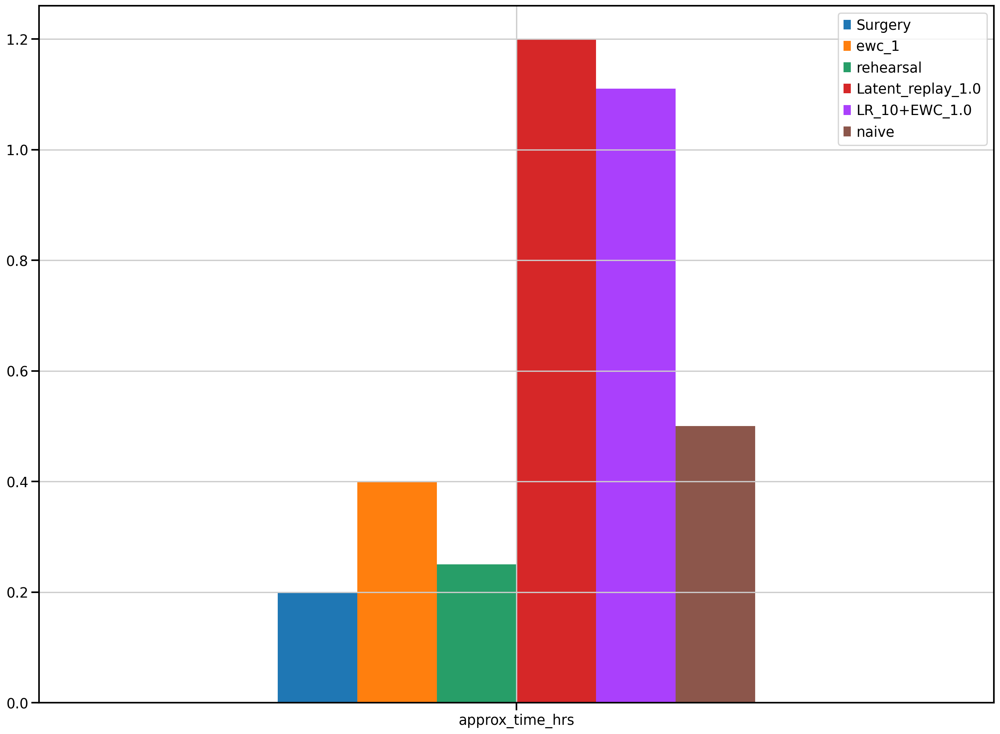

In [84]:
ax = methods_metrics_df.plot.bar(rot=0, figsize = (20,15))

In [85]:
run_outside_colab=True # cuz /home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scvi_colab/_core.py:41: UserWarning: 
                       #Not currently in Google Colab environment.
                       #Please run with `run_outside_colab=True` to override.
                       #Returning with no further action.
                       #warn(
!pip install --quiet scvi-colab
!pip install --quiet scib-metrics
from scvi_colab import install

install()
#had to run the cell twice/thrice??!!

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scvi_colab/_core.py:41: UserWarning: 
                Not currently in Google Colab environment.

                Please run with `run_outside_colab=True` to override.

                Returning with no further action.
                
  warn(


In [86]:
adata.obsm["X_surgery"] = new_trvae_surgery.get_latent(adata.X, adata.obs[condition_key])
adata.obsm

adata.obsm["X_EWC_1"] = new_trvae_EWC_1.get_latent(adata.X, adata.obs[condition_key])
adata.obsm

adata.obsm["X_LR_1"] = new_trvae_LR_1.get_latent(adata.X, adata.obs[condition_key])
adata.obsm

adata.obsm["X_LR_1_EWC_1"] = new_trvae_LR_1_EWC_1.get_latent(adata.X, adata.obs[condition_key])
adata.obsm

adata.obsm["X_rehearsal"] = new_trvae_rehearsal.get_latent(adata.X, adata.obs[condition_key])
adata.obsm

adata.obsm["X_std"] = trvae_std.get_latent(adata.X, adata.obs[condition_key])
adata.obsm

AxisArrays with keys: X_surgery, X_EWC_1, X_LR_1, X_LR_1_EWC_1, X_rehearsal, X_std

In [87]:
sc.pp.neighbors(adata, n_neighbors=8, use_rep="X_surgery")
sc.tl.leiden(adata)

sc.pp.neighbors(adata, n_neighbors=8, use_rep="X_EWC_1")
sc.tl.leiden(adata)

sc.pp.neighbors(adata, n_neighbors=8, use_rep="X_LR_1")
sc.tl.leiden(adata)

sc.pp.neighbors(adata, n_neighbors=8, use_rep="X_LR_1_EWC_1")
sc.tl.leiden(adata)

sc.pp.neighbors(adata, n_neighbors=8, use_rep="X_rehearsal")
sc.tl.leiden(adata)

sc.pp.neighbors(adata, n_neighbors=8, use_rep="X_std")
sc.tl.leiden(adata)

In [88]:
# !pip install pymde

In [89]:
from scvi.model.utils import mde
adata.obsm["X_mde_surgery"] = mde(adata.obsm["X_surgery"])
adata.obsm["X_mde_EWC_1"] = mde(adata.obsm["X_EWC_1"])
adata.obsm["X_mde_LR_1"] = mde(adata.obsm["X_LR_1"])
adata.obsm["X_mde_LR_1_EWC_1"] = mde(adata.obsm["X_LR_1_EWC_1"])
adata.obsm["X_mde_rehearsal"] = mde(adata.obsm["X_rehearsal"])
adata.obsm["X_mde_std"] = mde(adata.obsm["X_std"])

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


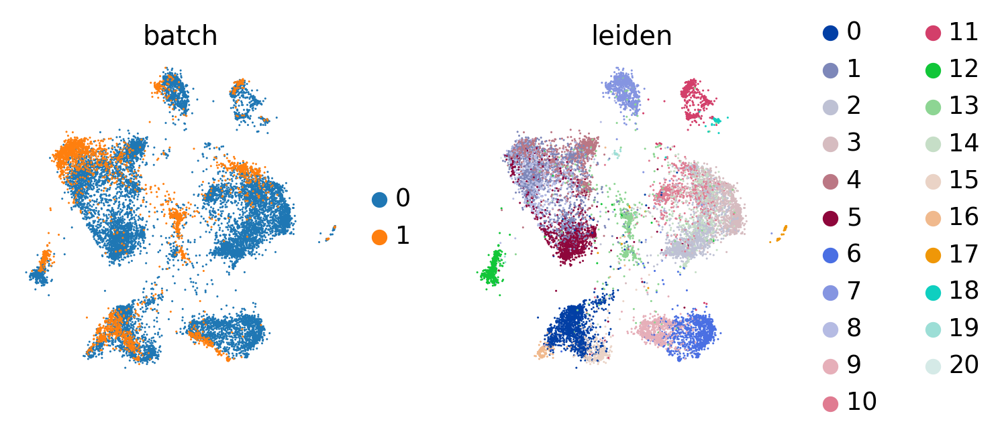

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


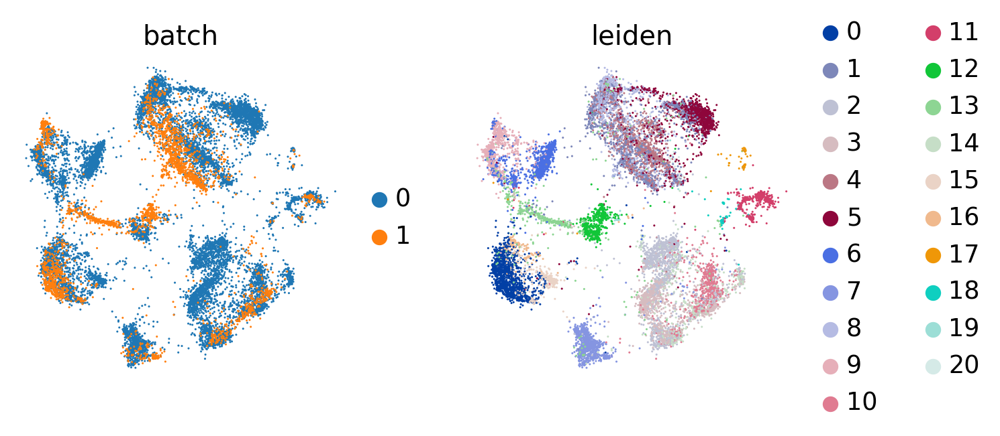

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


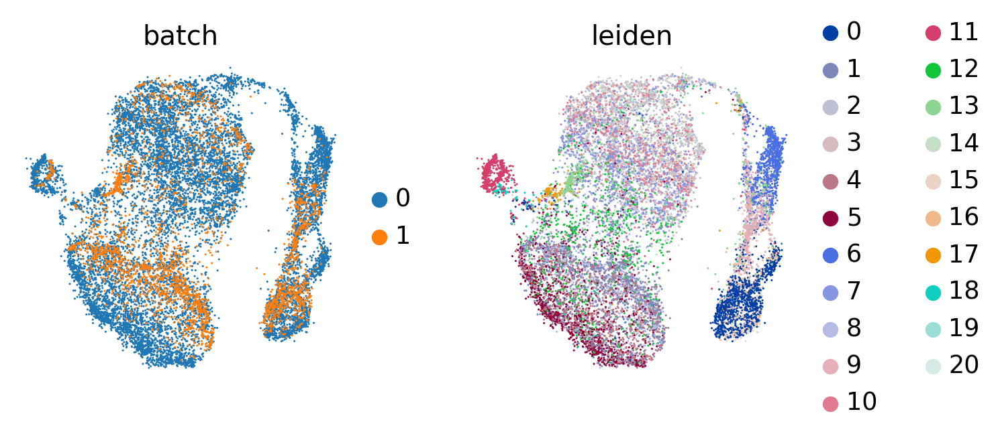

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


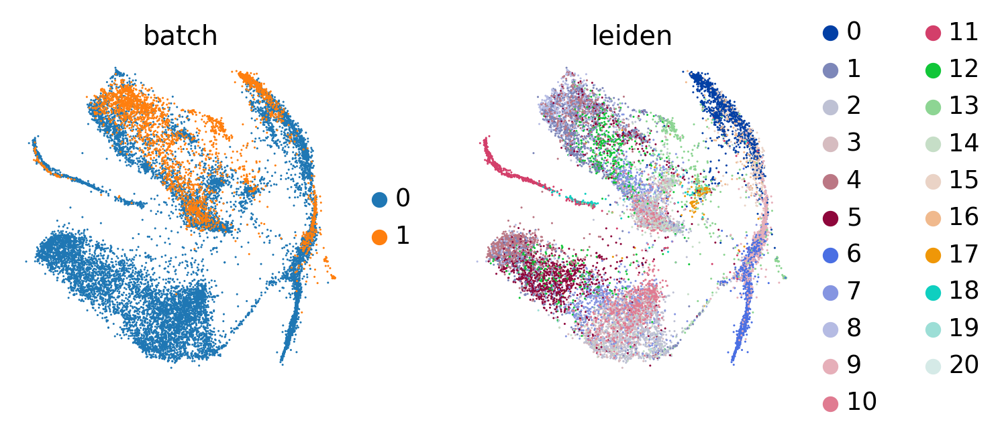

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


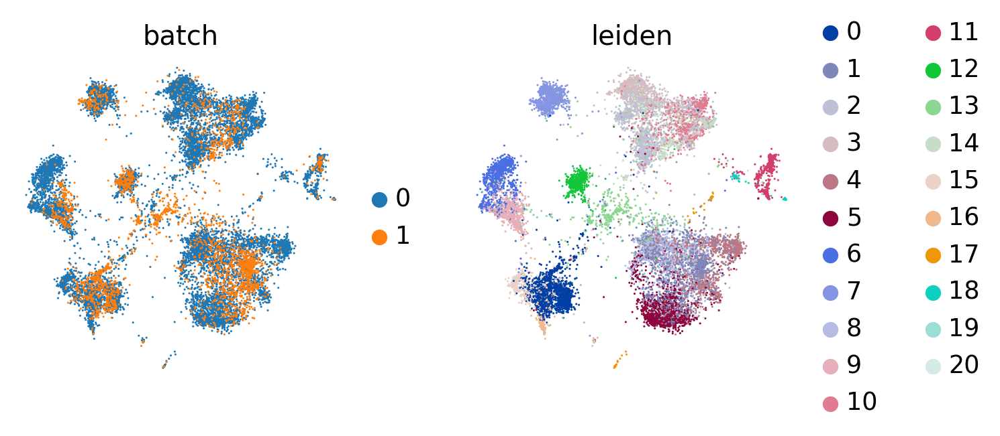

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


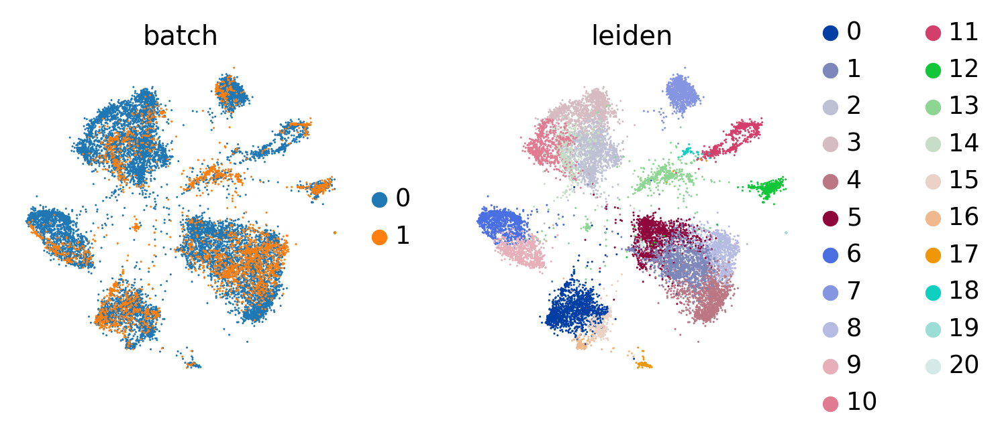

In [90]:
sc.pl.embedding(
    adata,
    basis="X_mde_surgery",
    color=["batch", "leiden"],
    frameon=False,
    ncols=2,
)

sc.pl.embedding(
    adata,
    basis="X_mde_EWC_1",
    color=["batch", "leiden"],
    frameon=False,
    ncols=2,
)

sc.pl.embedding(
    adata,
    basis="X_mde_LR_1",
    color=["batch", "leiden"],
    frameon=False,
    ncols=2,
)

sc.pl.embedding(
    adata,
    basis="X_mde_LR_1_EWC_1",
    color=["batch", "leiden"],
    frameon=False,
    ncols=2,
)

sc.pl.embedding(
    adata,
    basis="X_mde_rehearsal",
    color=["batch", "leiden"],
    frameon=False,
    ncols=2,
)

sc.pl.embedding(
    adata,
    basis="X_mde_std",
    color=["batch", "leiden"],
    frameon=False,
    ncols=2,
)

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


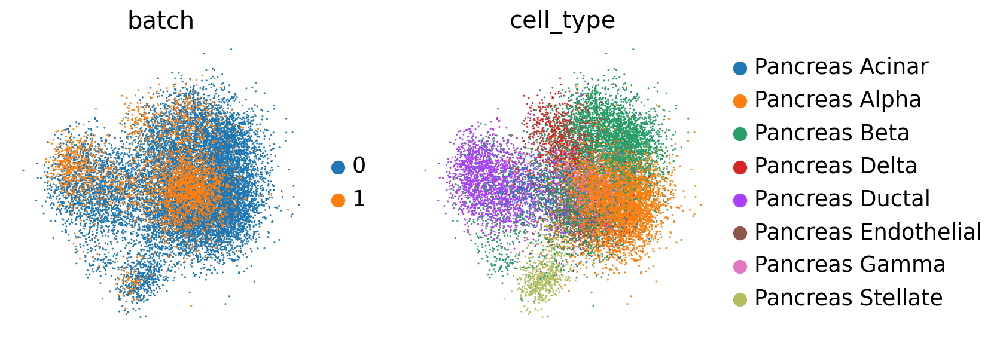

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


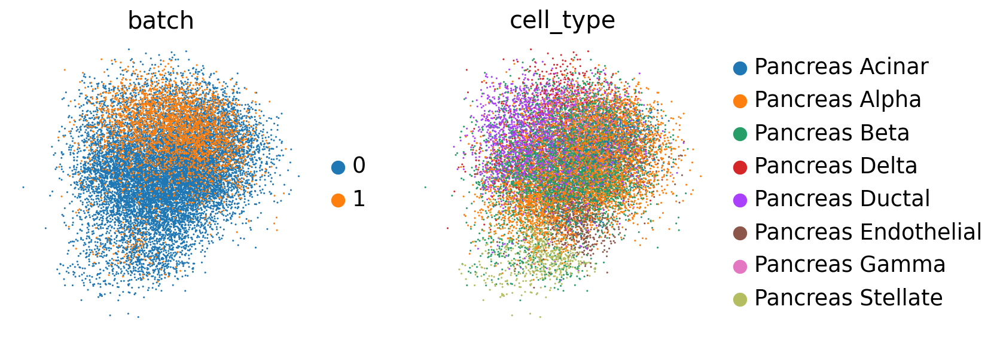

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


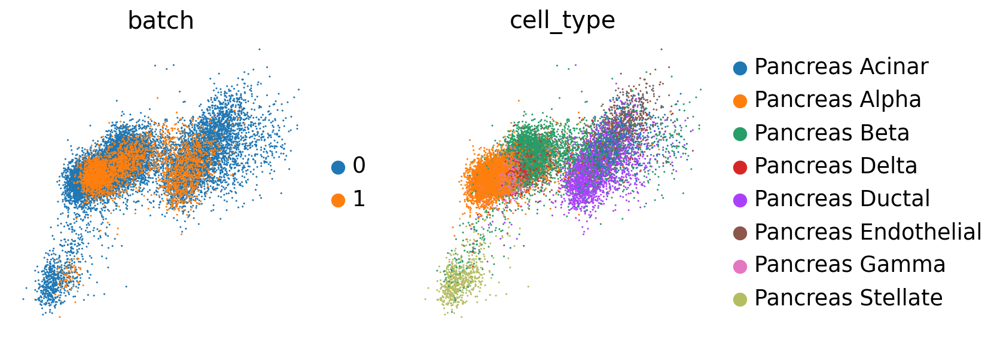

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


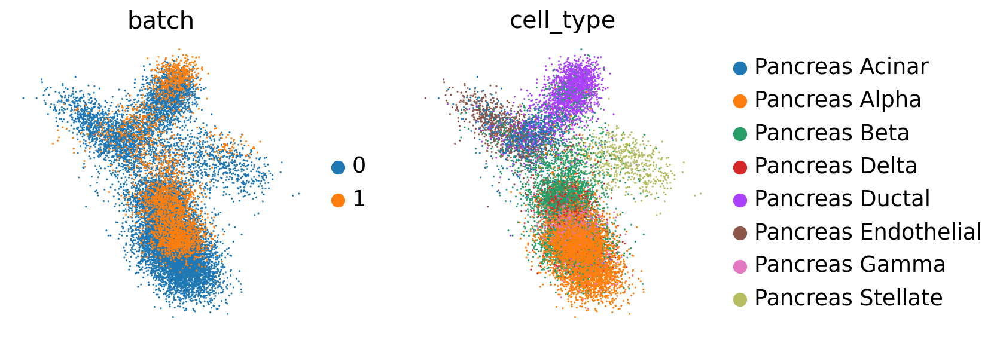

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


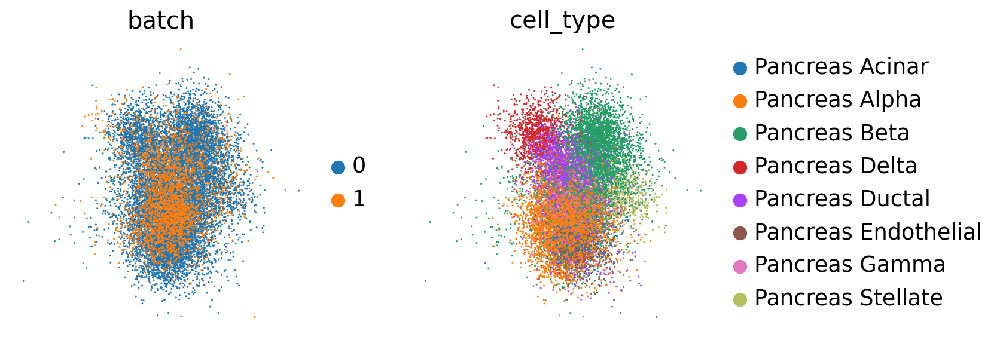

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


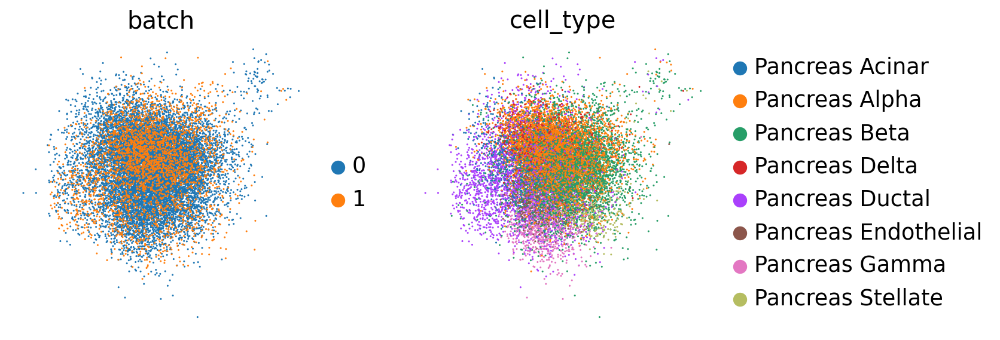

In [91]:
sc.pl.embedding(
    adata, basis="X_surgery", color=["batch", "cell_type"], ncols=2, frameon=False
)

sc.pl.embedding(
    adata, basis="X_EWC_1", color=["batch", "cell_type"], ncols=2, frameon=False
)

sc.pl.embedding(
    adata, basis="X_LR_1", color=["batch", "cell_type"], ncols=2, frameon=False
)

sc.pl.embedding(
    adata, basis="X_LR_1_EWC_1", color=["batch", "cell_type"], ncols=2, frameon=False
)

sc.pl.embedding(
    adata, basis="X_rehearsal", color=["batch", "cell_type"], ncols=2, frameon=False
)

sc.pl.embedding(
    adata, basis="X_std", color=["batch", "cell_type"], ncols=2, frameon=False
)

In [92]:
from scib_metrics.benchmark import Benchmarker
bm = Benchmarker(
    adata,
    batch_key="batch",
    label_key="cell_type",
    embedding_obsm_keys=["X_surgery", 'X_EWC_1', "X_LR_1", "X_LR_1_EWC_1", "X_rehearsal", "X_std"] 
)
bm.benchmark()

Metrics:   0%|                                                                                   | 0/10 [00:00<?, ?it/s]WARNING:jax._src.lib.xla_bridge:No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)

Metrics:  10%|███████▌                                                                   | 1/10 [00:05<00:47,  5.23s/it]/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scib_metrics/_nmi_ari.py:23: DeprecationWarning: resolution_parameter keyword argument is deprecated, use resolution=... instead
  clustering = g.community_leiden(objective_function="modularity", weights="weight", resolution_parameter=resolution)
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scib_metrics/_nmi_ari.py:23: DeprecationWarning: resolution_parameter keyword argument is deprecated, use resolution=... instead
  clustering = g.community_leiden(objective_function="modularity", weights="weight", resolution_parameter=resoluti

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scib_metrics/_nmi_ari.py:23: DeprecationWarning: resolution_parameter keyword argument is deprecated, use resolution=... instead
  clustering = g.community_leiden(objective_function="modularity", weights="weight", resolution_parameter=resolution)

Metrics:   0%|                                                                                   | 0/10 [00:00<?, ?it/s]
                                                                                                                        
Metrics:  10%|███████▌                                                                   | 1/10 [00:04<00:41,  4.60s/it]/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scib_metrics/_nmi_ari.py:23: DeprecationWarning: resolution_parameter keyword argument is deprecated, use resolution=... instead
  clustering = g.community_leiden(objective_function="modularity", weights="weight", resolution_parameter=resolution)

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scib_metrics/_nmi_ari.py:23: DeprecationWarning: resolution_parameter keyword argument is deprecated, use resolution=... instead
  clustering = g.community_leiden(objective_function="modularity", weights="weight", resolution_parameter=resolution)
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scib_metrics/_nmi_ari.py:23: DeprecationWarning: resolution_parameter keyword argument is deprecated, use resolution=... instead
  clustering = g.community_leiden(objective_function="modularity", weights="weight", resolution_parameter=resolution)

Metrics:  70%|████████████████████████████████████████████████████▌                      | 7/10 [00:16<00:09,  3.21s/it]/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.wa

/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scib_metrics/_nmi_ari.py:23: DeprecationWarning: resolution_parameter keyword argument is deprecated, use resolution=... instead
  clustering = g.community_leiden(objective_function="modularity", weights="weight", resolution_parameter=resolution)
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scib_metrics/_nmi_ari.py:23: DeprecationWarning: resolution_parameter keyword argument is deprecated, use resolution=... instead
  clustering = g.community_leiden(objective_function="modularity", weights="weight", resolution_parameter=resolution)
/home/mohammed/anaconda3/envs/scib_metrics/lib/python3.10/site-packages/scib_metrics/_nmi_ari.py:23: DeprecationWarning: resolution_parameter keyword argument is deprecated, use resolution=... instead
  clustering = g.community_leiden(objective_function="modularity", weights="weight", resolution_parameter=resolution)
/home/mohammed/anaconda3/envs/scib_metrics/

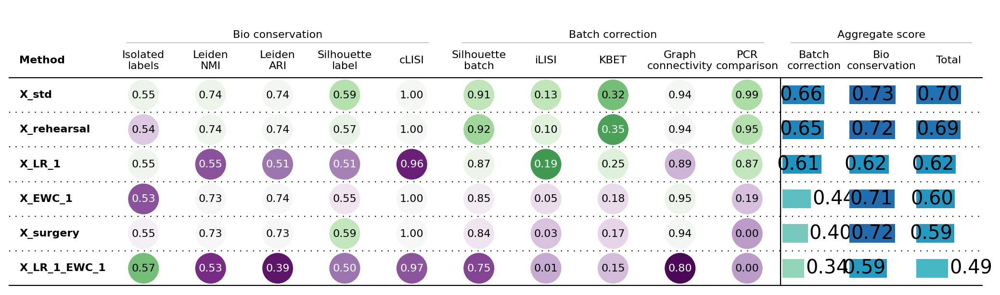

In [93]:
bm.plot_results_table(min_max_scale=False)

In [94]:
df = bm.get_results(min_max_scale=False)
print(df)

               Isolated labels        Leiden NMI        Leiden ARI  \
Embedding                                                            
X_surgery             0.550651          0.726629           0.72992   
X_EWC_1               0.531593           0.72551          0.735056   
X_LR_1                0.553415          0.552748          0.512189   
X_LR_1_EWC_1          0.567706          0.525077          0.390423   
X_rehearsal           0.544764          0.740039          0.742907   
X_std                 0.554358          0.743725          0.741904   
Metric Type   Bio conservation  Bio conservation  Bio conservation   

              Silhouette label             cLISI  Silhouette batch  \
Embedding                                                            
X_surgery             0.585786          0.996372           0.84446   
X_EWC_1               0.548748          0.995863          0.850594   
X_LR_1                0.507334          0.957465          0.869977   
X_LR_1_EWC_1       

In [95]:
cols=df.columns
df[cols] = df[cols].apply(pd.to_numeric, errors='coerce') #errors='coerce' for convert bad non numeric values to NaN
df.info()
df_transposed = df.T
df_transposed

<class 'pandas.core.frame.DataFrame'>
Index: 7 entries, X_surgery to Metric Type
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Isolated labels     6 non-null      float64
 1   Leiden NMI          6 non-null      float64
 2   Leiden ARI          6 non-null      float64
 3   Silhouette label    6 non-null      float64
 4   cLISI               6 non-null      float64
 5   Silhouette batch    6 non-null      float64
 6   iLISI               6 non-null      float64
 7   KBET                6 non-null      float64
 8   Graph connectivity  6 non-null      float64
 9   PCR comparison      6 non-null      float64
 10  Batch correction    6 non-null      float64
 11  Bio conservation    6 non-null      float64
 12  Total               6 non-null      float64
dtypes: float64(13)
memory usage: 1.1+ KB


Embedding,X_surgery,X_EWC_1,X_LR_1,X_LR_1_EWC_1,X_rehearsal,X_std,Metric Type
Isolated labels,0.550651,0.531593,0.553415,0.567706,0.544764,0.554358,NaN
Leiden NMI,0.726629,0.725510,0.552748,0.525077,0.740039,0.743725,NaN
Leiden ARI,0.729920,0.735056,0.512189,0.390423,0.742907,0.741904,NaN
Silhouette label,0.585786,0.548748,0.507334,0.502607,0.568372,0.591123,NaN
cLISI,0.996372,0.995863,0.957465,0.965036,0.996561,0.996750,NaN
Silhouette batch,0.844460,0.850594,0.869977,0.752506,0.922787,0.905358,NaN
iLISI,0.030289,0.050574,0.186847,0.014477,0.101478,0.125414,NaN
KBET,0.171504,0.179369,0.245940,0.149192,0.347280,0.323232,NaN
Graph connectivity,0.943592,0.949781,0.891702,0.802069,0.937352,0.941770,NaN
PCR comparison,0.000000,0.187481,0.873414,0.000000,0.949699,0.990474,NaN


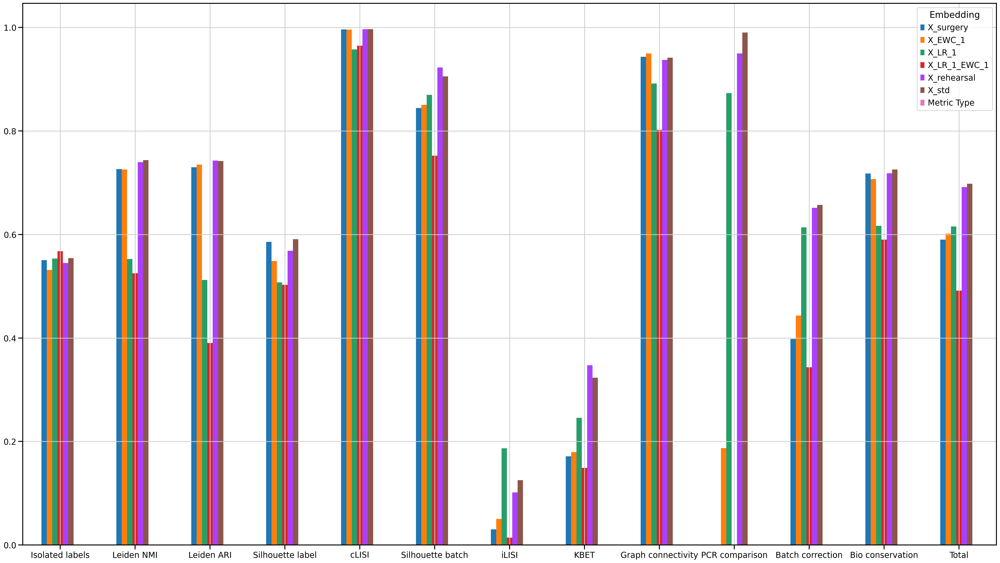

In [96]:
# df=df.astype(float)
ax = df_transposed.plot.bar(rot=0, figsize = (35,20))

In [97]:
elapsed_time = time.time() - st
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(elapsed_time)))

Execution time: 06:09:06
